# Problem Title : MelanoAI: Intelligent Skin Cancer Screening

# Objective : 

Build an Artificial Intelligence model to accurately classify skin lesions as benign or
malignant, and provide a user-friendly interface for interaction

# ⚫ Exploratory Data Analysis (EDA) and Data Preprocessing

# Importing Necessary Libraries

In [1]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from collections import Counter
import numpy as np
import imagehash
from PIL import Image



# Setting up paths for train and test datasets

In [12]:
train_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\train"
test_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test"


# Defining Subdirectories for Classes
benign_train_dir = os.path.join(train_dir, "benign")
malignant_train_dir = os.path.join(train_dir, "malignant")
benign_test_dir = os.path.join(test_dir, "benign")
malignant_test_dir = os.path.join(test_dir, "malignant")


# Checking Dataset Structure and Image Counts

In [13]:
def count_images(directory):
    """Counts the number of images in each category within a directory."""
    benign_count = len(os.listdir(os.path.join(directory, "benign")))
    malignant_count = len(os.listdir(os.path.join(directory, "malignant")))
    return {"benign": benign_count, "malignant": malignant_count}

# Count images in train and test sets
train_counts = count_images(train_dir)
test_counts = count_images(test_dir)

# Displaying Counts
print("Summary of Image Counts:")
print("Train - Benign:", train_counts["benign"], "| Malignant:", train_counts["malignant"])
print("Test - Benign:", test_counts["benign"], "| Malignant:", test_counts["malignant"])

Summary of Image Counts:
Train - Benign: 5000 | Malignant: 4605
Test - Benign: 500 | Malignant: 500


# Displaying Sample Images

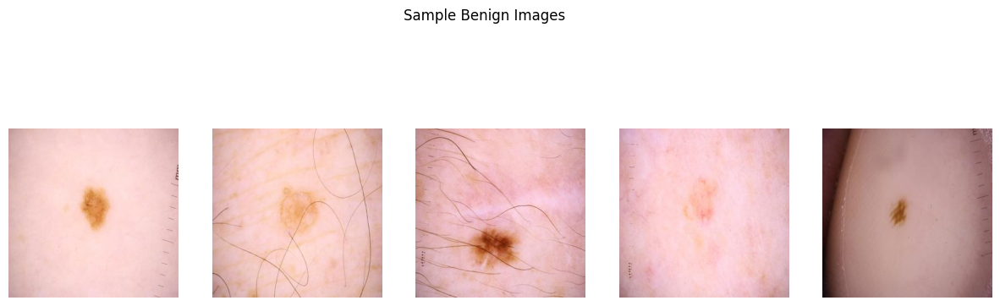

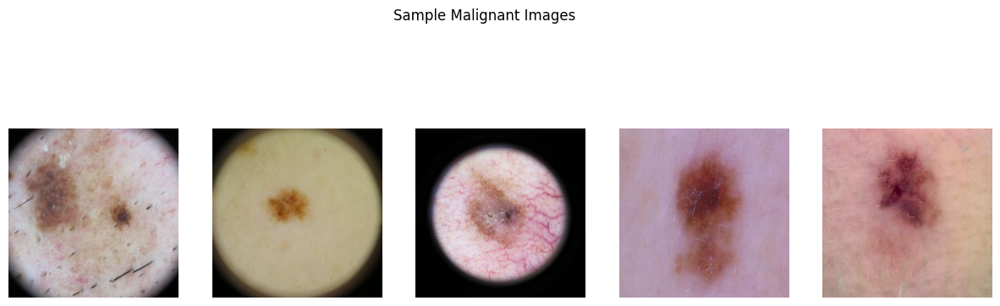

In [14]:
def display_sample_images(category, sample_size=5):
    """Displays a sample of images for a given category and sample size."""
    if category == "benign":
        path = benign_train_dir
    elif category == "malignant":
        path = malignant_train_dir
    else:
        print("Invalid category. Choose 'benign' or 'malignant'.")
        return
    
    images = os.listdir(path)[:sample_size]
    fig, axes = plt.subplots(1, sample_size, figsize=(15, 5))
    fig.suptitle(f"Sample {category.capitalize()} Images")
    
    for i, img_name in enumerate(images):
        img_path = os.path.join(path, img_name)
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis("off")

# Displaying Sample Images from Benign and Malignant Categories
display_sample_images("benign", sample_size=5)
display_sample_images("malignant", sample_size=5)

# Class distribution in train and test data

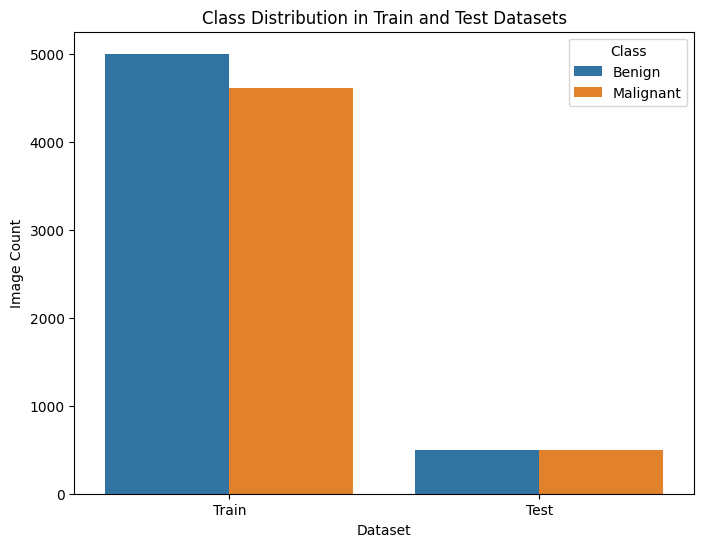

In [15]:

# Display class distribution in train and test data
train_counts = count_images(train_dir)
test_counts = count_images(test_dir)

# Creating Data for Visualization
distribution_data = {
    "Set": ["Train", "Train", "Test", "Test"],
    "Class": ["Benign", "Malignant", "Benign", "Malignant"],
    "Count": [train_counts["benign"], train_counts["malignant"], test_counts["benign"], test_counts["malignant"]]
}


# Plotting Class Distribution for Train and Test Data
plt.figure(figsize=(8, 6))
sns.barplot(x="Set", y="Count", hue="Class", data=distribution_data)
plt.title("Class Distribution in Train and Test Datasets")
plt.xlabel("Dataset")
plt.ylabel("Image Count")
plt.show()


# Pixel Intensity Analysis

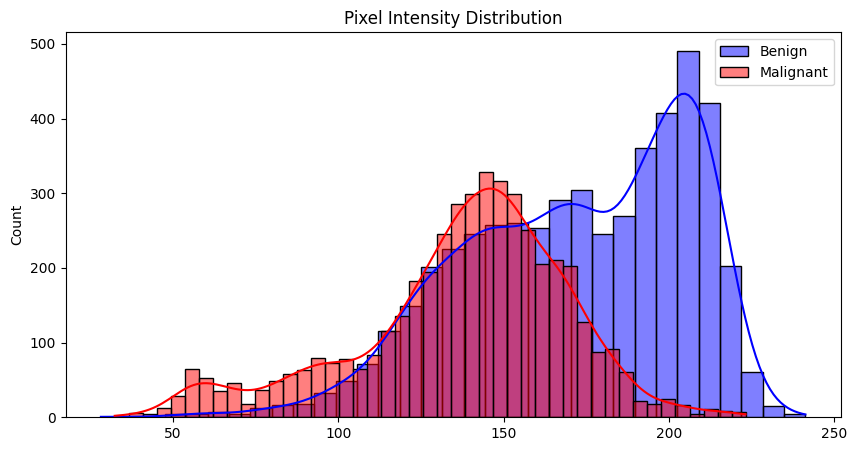

In [16]:
def analyze_pixel_intensity(image_path):
    """Calculates mean pixel intensity of a grayscale image."""
    img = Image.open(image_path).convert("L")
    return np.array(img).mean()

# Gathering Pixel Intensity Data
benign_intensity = [analyze_pixel_intensity(os.path.join(benign_train_dir, img)) for img in os.listdir(benign_train_dir)]
malignant_intensity = [analyze_pixel_intensity(os.path.join(malignant_train_dir, img)) for img in os.listdir(malignant_train_dir)]

# Plotting Pixel Intensity Distribution
plt.figure(figsize=(10, 5))
sns.histplot(benign_intensity, label="Benign", color="blue", kde=True)
sns.histplot(malignant_intensity, label="Malignant", color="red", kde=True)
plt.title("Pixel Intensity Distribution")
plt.legend()
plt.show()

# Color Intensity

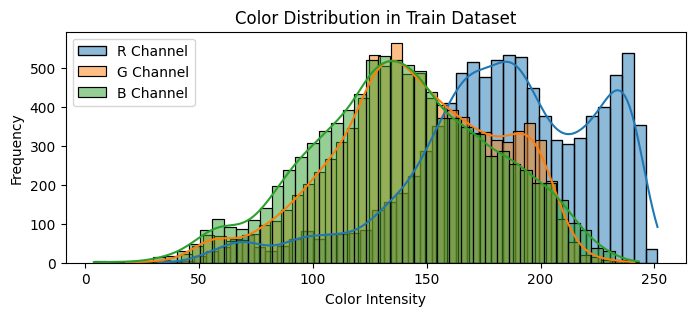

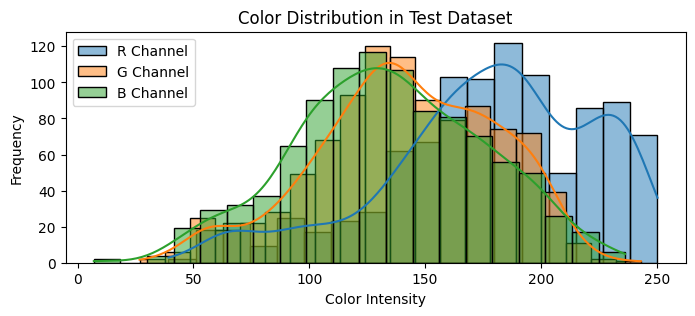

In [17]:
# Calculating Average Color Intensity

def calculate_color_distribution(directory):
    """Calculates average color intensity for RGB channels in each category."""
    color_data = {"R": [], "G": [], "B": []}
    
    for category in ["benign", "malignant"]:
        category_dir = os.path.join(directory, category)
        for img_name in os.listdir(category_dir):
            img_path = os.path.join(category_dir, img_name)
            img = Image.open(img_path).convert("RGB")
            img_array = np.array(img)
            
            # Calculate mean for each RGB channel
            color_data["R"].append(img_array[:, :, 0].mean())
            color_data["G"].append(img_array[:, :, 1].mean())
            color_data["B"].append(img_array[:, :, 2].mean())
            
    return color_data

# Calculate Color Distribution for Train and Test Data

train_color_distribution = calculate_color_distribution(train_dir)
test_color_distribution = calculate_color_distribution(test_dir)

# Visualizing Color Distribution

def plot_color_distribution(color_distribution, dataset_name):
    """Plots RGB color distribution for a given dataset."""
    plt.figure(figsize=(8, 3))
    for color in ["R", "G", "B"]:
        sns.histplot(color_distribution[color], label=f"{color} Channel", kde=True)
    plt.title(f"Color Distribution in {dataset_name} Dataset")
    plt.xlabel("Color Intensity")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Plotting Color Distribution for Train and Test Sets
plot_color_distribution(train_color_distribution, "Train")
plot_color_distribution(test_color_distribution, "Test")


# Local Binary Pattern

c:\IP\my_env\Lib\site-packages\skimage\feature\texture.py:360: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


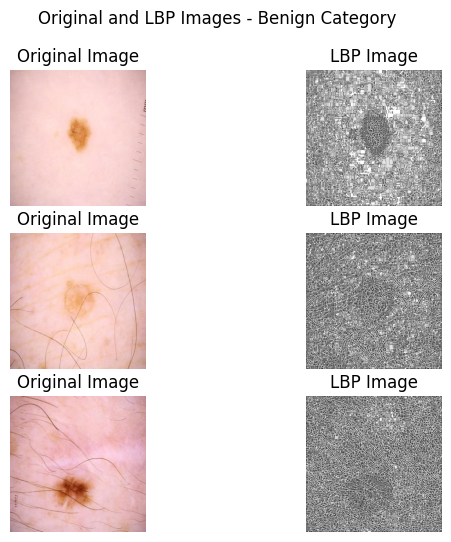

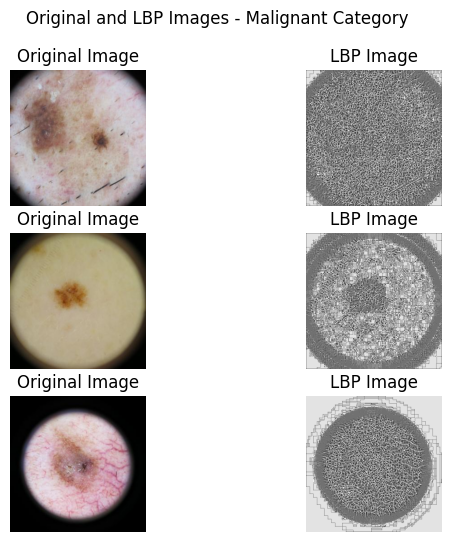

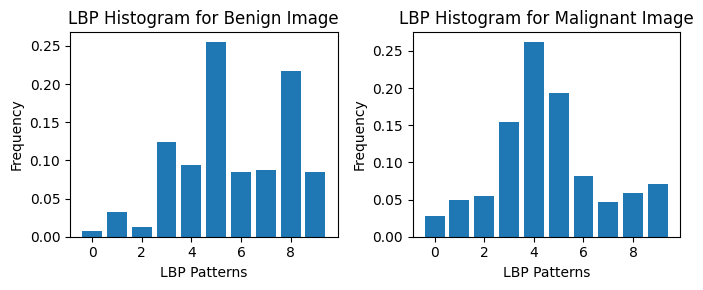

In [18]:
# Import necessary libraries
import os
import numpy as np
from skimage.feature import local_binary_pattern
from skimage.color import rgb2gray
from skimage import io
import matplotlib.pyplot as plt

# Parameters for LBP
radius = 1  # Radius of the circular neighborhood
n_points = 8 * radius  # Number of points to consider (8 for a circle)

# 1. Function to Compute LBP

def compute_lbp(image_path):
    """Computes the Local Binary Pattern of an image."""
    # Read the image and convert it to grayscale
    image = io.imread(image_path)
    gray_image = rgb2gray(image)
    
    # Compute LBP
    lbp_image = local_binary_pattern(gray_image, n_points, radius, method="uniform")
    return lbp_image

# 2. Displaying Original and LBP Images

def display_lbp_samples(category, sample_size=3):
    """Displays original and LBP images for a few samples in the specified category."""
    if category == "benign":
        path = benign_train_dir
    elif category == "malignant":
        path = malignant_train_dir
    else:
        print("Invalid category. Choose 'benign' or 'malignant'.")
        return
    
    images = os.listdir(path)[:sample_size]
    fig, axes = plt.subplots(sample_size, 2, figsize=(7, 2 * sample_size))
    fig.suptitle(f"Original and LBP Images - {category.capitalize()} Category")
    
    for i, img_name in enumerate(images):
        img_path = os.path.join(path, img_name)
        original_img = io.imread(img_path)
        lbp_img = compute_lbp(img_path)
        
        # Display original and LBP image
        axes[i, 0].imshow(original_img)
        axes[i, 0].set_title("Original Image")
        axes[i, 0].axis("off")
        
        axes[i, 1].imshow(lbp_img, cmap="gray")
        axes[i, 1].set_title("LBP Image")
        axes[i, 1].axis("off")

# Display LBP samples for both classes
display_lbp_samples("benign", sample_size=3)
display_lbp_samples("malignant", sample_size=3)

# Histogram of LBP Features

def lbp_histogram(lbp_image):
    """Calculates histogram of LBP features."""
    hist, _ = np.histogram(lbp_image.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    return hist / hist.sum()  # Normalize the histogram

# Example: Compute and display LBP histogram for a single benign and malignant image
sample_benign_image = os.path.join(benign_train_dir, os.listdir(benign_train_dir)[0])
sample_malignant_image = os.path.join(malignant_train_dir, os.listdir(malignant_train_dir)[0])

# Compute LBP and histograms
benign_lbp = compute_lbp(sample_benign_image)
malignant_lbp = compute_lbp(sample_malignant_image)
benign_hist = lbp_histogram(benign_lbp)
malignant_hist = lbp_histogram(malignant_lbp)

# Plot LBP histograms
plt.figure(figsize=(7, 3))
plt.subplot(1, 2, 1)
plt.bar(range(len(benign_hist)), benign_hist)
plt.title("LBP Histogram for Benign Image")
plt.xlabel("LBP Patterns")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.bar(range(len(malignant_hist)), malignant_hist)
plt.title("LBP Histogram for Malignant Image")
plt.xlabel("LBP Patterns")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


# Finding Duplicates

Number of duplicates in Training Set: 26
Number of duplicates in Testing Set: 1
Duplicate Images in Training Set:


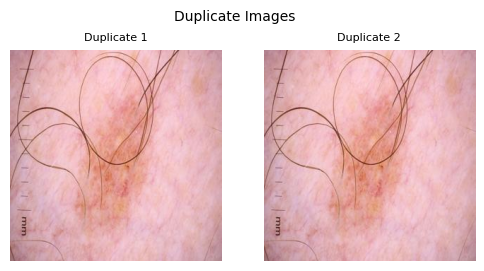

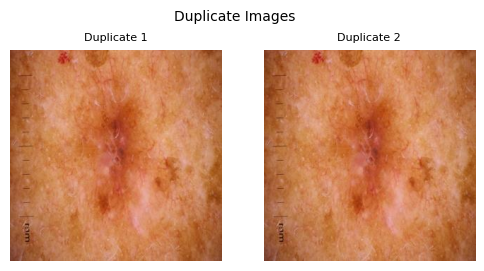

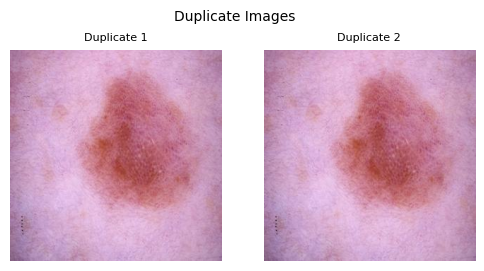

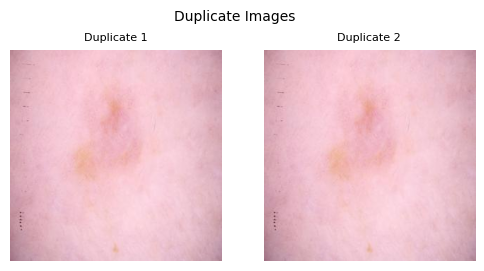

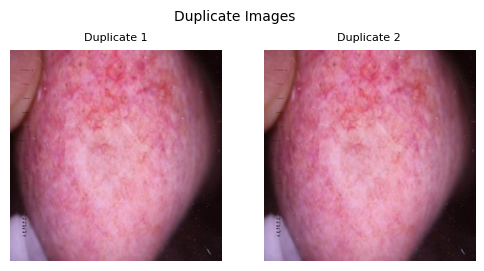

...

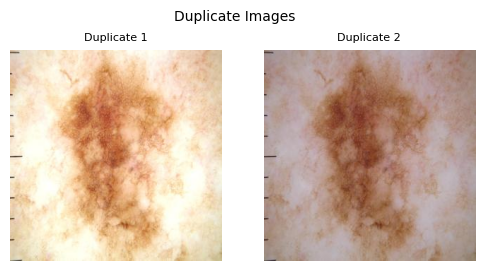

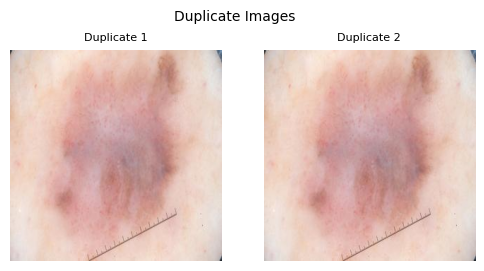

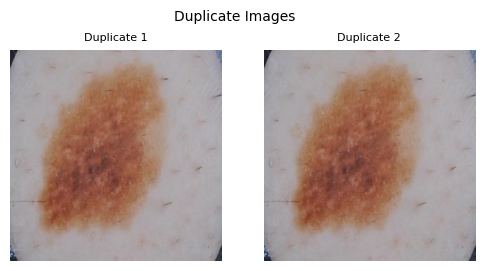

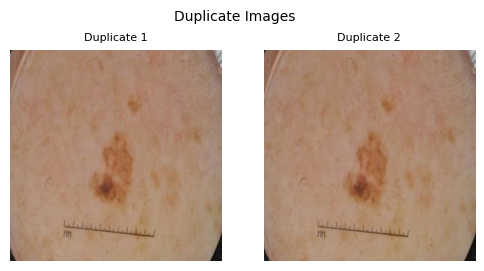

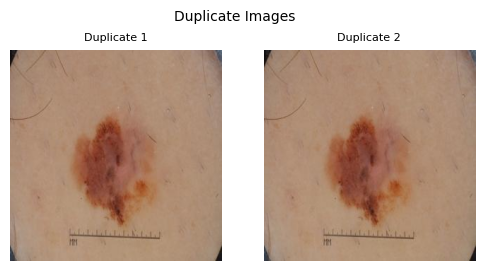

Duplicate Images in Testing Set:


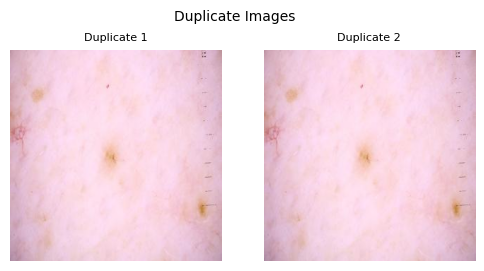

In [19]:
# Function to compute image hash
def get_image_hash(image_path):
    """Computes a perceptual hash for an image."""
    with Image.open(image_path) as img:
        return imagehash.phash(img)  # Perceptual hash

# Function to find duplicates in a directory
def find_duplicates(directory):
    """Finds and returns duplicate images in a given directory, along with their count."""
    hashes = {}
    duplicates = []
    
    for category in ["benign", "malignant"]:
        category_dir = os.path.join(directory, category)
        
        for img_name in os.listdir(category_dir):
            img_path = os.path.join(category_dir, img_name)
            img_hash = get_image_hash(img_path)
            
            # Check if hash is already in dictionary
            if img_hash in hashes:
                duplicates.append((hashes[img_hash], img_path))  # Store paths of duplicate images
            else:
                hashes[img_hash] = img_path  # Store unique image hash
    
    return duplicates

# Check for duplicates in train and test directories
train_duplicates = find_duplicates(train_dir)
test_duplicates = find_duplicates(test_dir)

# Print the number of duplicates found
print(f"Number of duplicates in Training Set: {len(train_duplicates)}")
print(f"Number of duplicates in Testing Set: {len(test_duplicates)}")

# Function to display duplicates in a small format
def display_duplicates(duplicates):
    """Displays pairs of duplicate images in a small format."""
    for dup1, dup2 in duplicates:
        fig, axes = plt.subplots(1, 2, figsize=(6, 3))  # Smaller figure size
        fig.suptitle("Duplicate Images", fontsize=10)
        
        # Load and display duplicate images side-by-side
        img1 = Image.open(dup1)
        img2 = Image.open(dup2)
        
        axes[0].imshow(img1)
        axes[0].set_title("Duplicate 1", fontsize=8)
        axes[0].axis("off")
        
        axes[1].imshow(img2)
        axes[1].set_title("Duplicate 2", fontsize=8)
        axes[1].axis("off")
        
        plt.show()

# Display duplicates if found
if train_duplicates:
    print("Duplicate Images in Training Set:")
    display_duplicates(train_duplicates)

if test_duplicates:
    print("Duplicate Images in Testing Set:")
    display_duplicates(test_duplicates)


# RGB to Greyscale

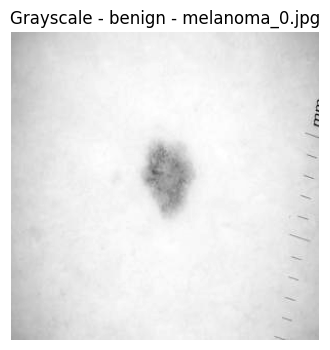

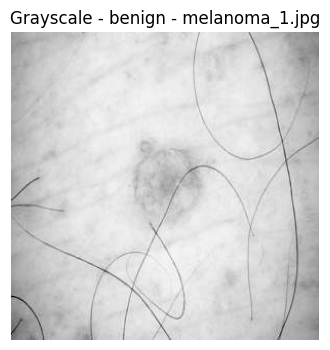

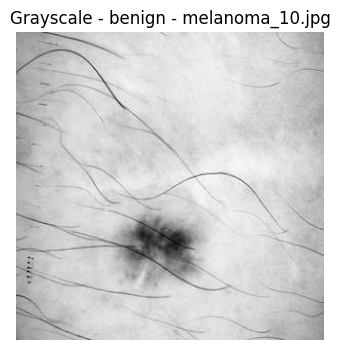

Converted all images in C:\IP\archive (1)\melanoma_cancer_dataset\train\benign to grayscale and saved to C:\IP\archive (1)\melanoma_cancer_dataset\train_grey\benign


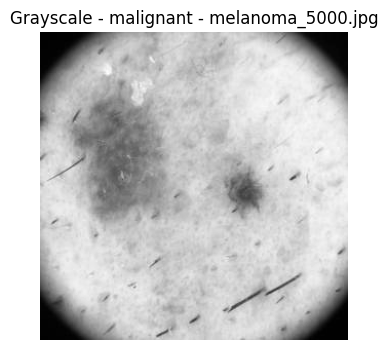

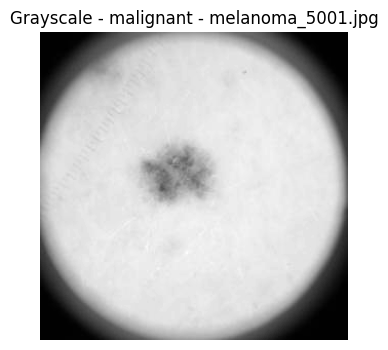

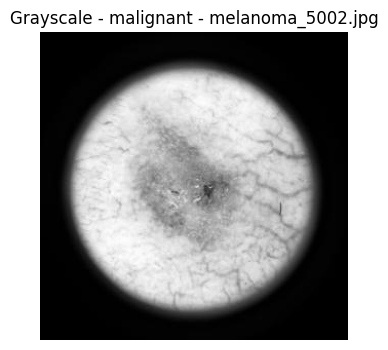

Converted all images in C:\IP\archive (1)\melanoma_cancer_dataset\train\malignant to grayscale and saved to C:\IP\archive (1)\melanoma_cancer_dataset\train_grey\malignant


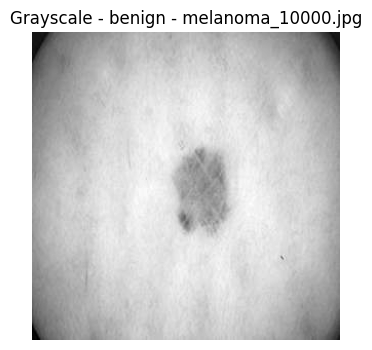

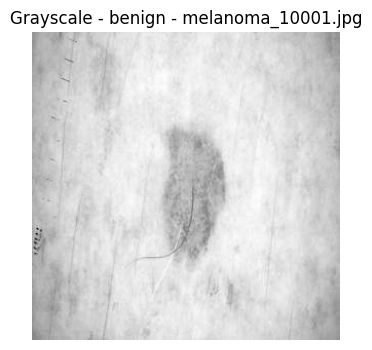

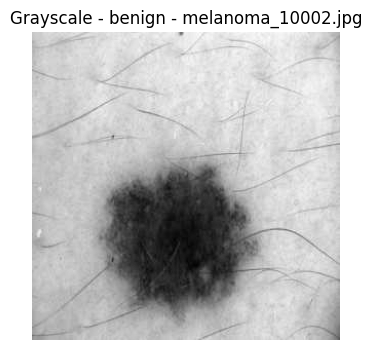

Converted all images in C:\IP\archive (1)\melanoma_cancer_dataset\test\benign to grayscale and saved to C:\IP\archive (1)\melanoma_cancer_dataset\test_grey\benign


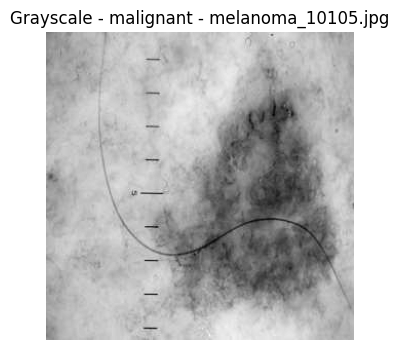

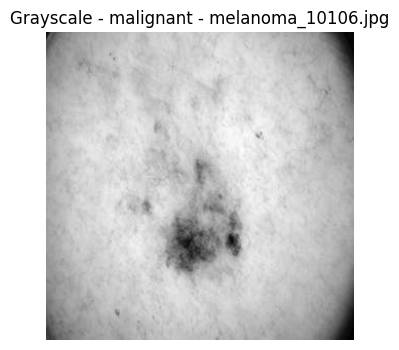

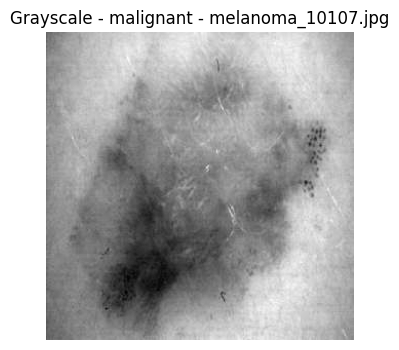

Converted all images in C:\IP\archive (1)\melanoma_cancer_dataset\test\malignant to grayscale and saved to C:\IP\archive (1)\melanoma_cancer_dataset\test_grey\malignant
All images have been converted to grayscale and saved in the respective folders.


In [27]:
# Import necessary libraries
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define dataset directories with full paths
train_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\train"  # replace with actual full path to your train folder
test_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test"    # replace with actual full path to your test folder

# Define output directories for grayscale images
train_gray_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\train_grey"  # Folder to save grayscale train images
test_gray_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test_grey"    # Folder to save grayscale test images

# Function to convert images to grayscale and save them, with display option
def convert_to_grayscale(input_dir, output_dir, display_samples=3):
    """Converts RGB images to grayscale, saves them, and displays a few samples."""
    
    # Iterate over each category (benign and malignant)
    for category in ["benign", "malignant"]:
        input_category_path = os.path.join(input_dir, category)
        output_category_path = os.path.join(output_dir, category)

        # Create output category directory if it doesn't exist
        os.makedirs(output_category_path, exist_ok=True)
        
        # Process each image in the category folder
        images_converted = 0
        for img_name in os.listdir(input_category_path):
            img_path = os.path.join(input_category_path, img_name)
            
            # Load the image and convert to grayscale
            with Image.open(img_path) as img:
                gray_img = img.convert("L")  # Convert to grayscale
            
                # Save the grayscale image in the output directory
                gray_img.save(os.path.join(output_category_path, img_name))
                
                # Display a few grayscale images after conversion
                if images_converted < display_samples:
                    plt.figure(figsize=(4, 2))
                    plt.imshow(gray_img, cmap="gray")
                    plt.title(f"Grayscale - {category} - {img_name}")
                    plt.axis("off")
                    plt.show()
                    images_converted += 1
        
        print(f"Converted all images in {input_category_path} to grayscale and saved to {output_category_path}")

# Convert images in train and test directories, displaying 3 sample images per category
convert_to_grayscale(train_dir, train_gray_dir, display_samples=3)
convert_to_grayscale(test_dir, test_gray_dir, display_samples=3)

print("All images have been converted to grayscale and saved in the respective folders.")


# Normalization


Displaying samples from category: train_grey/benign


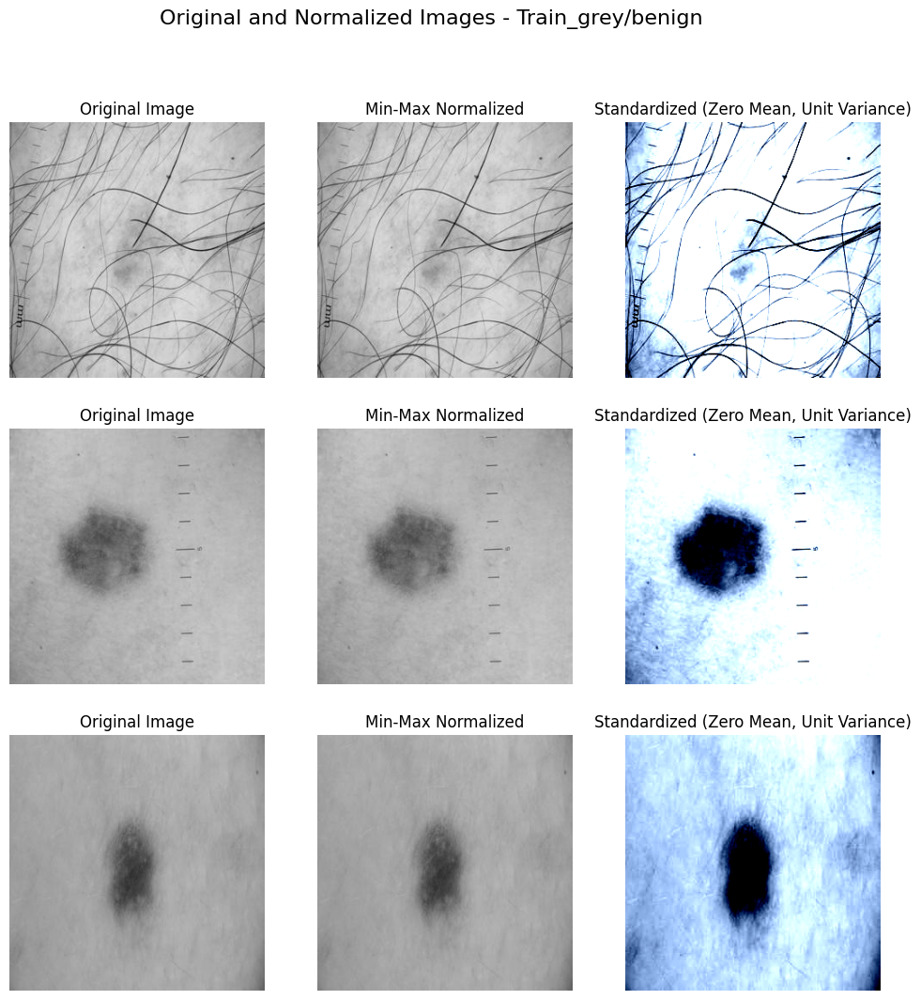


Displaying samples from category: train_grey/malignant


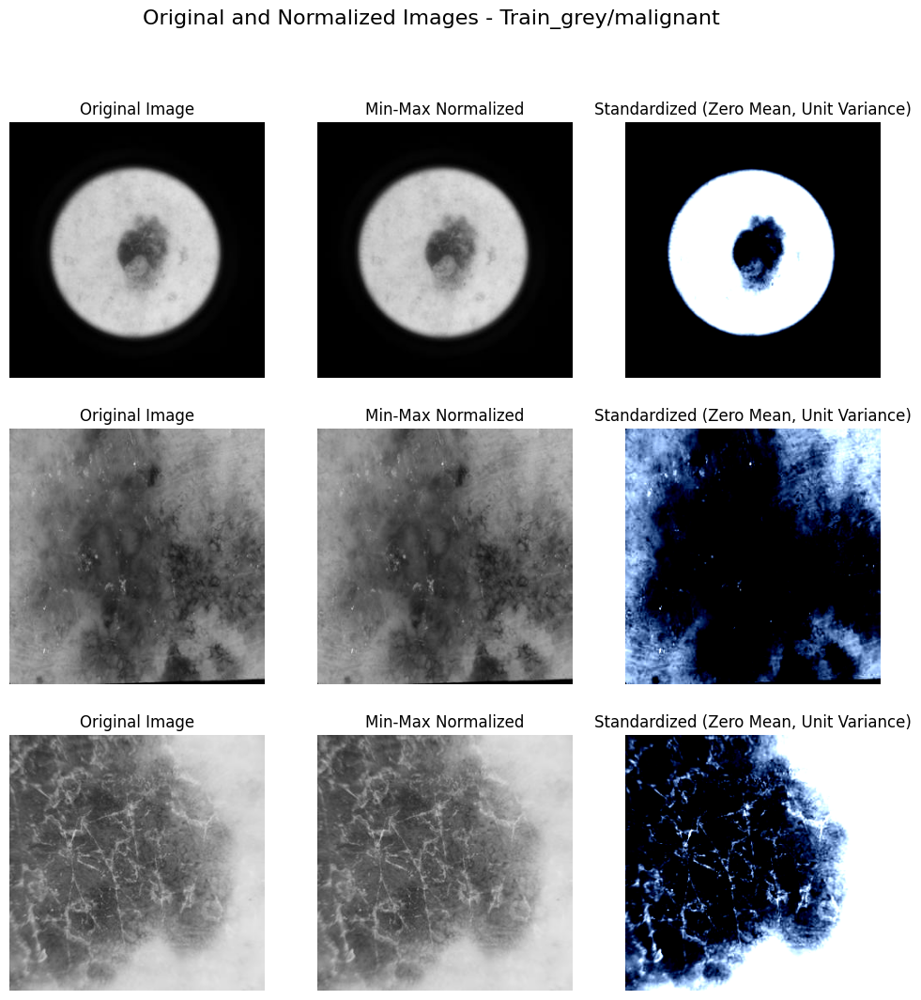


Displaying samples from category: test_grey/benign


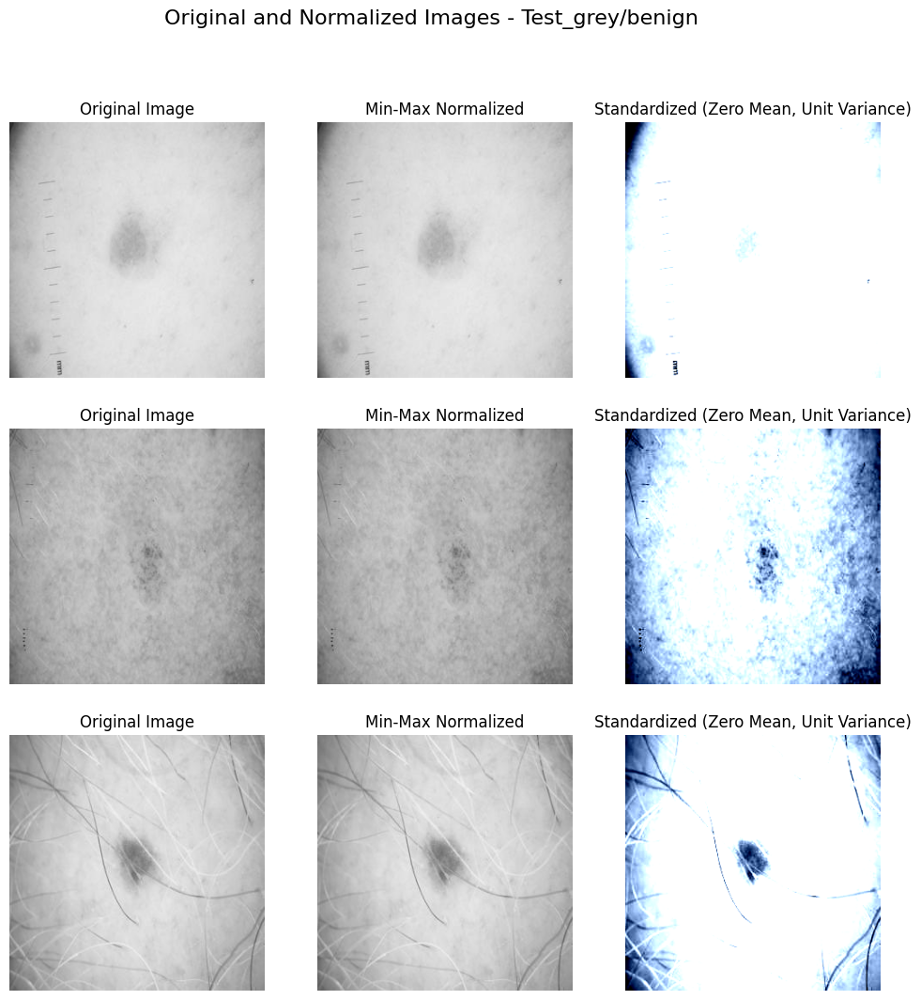


Displaying samples from category: test_grey/malignant


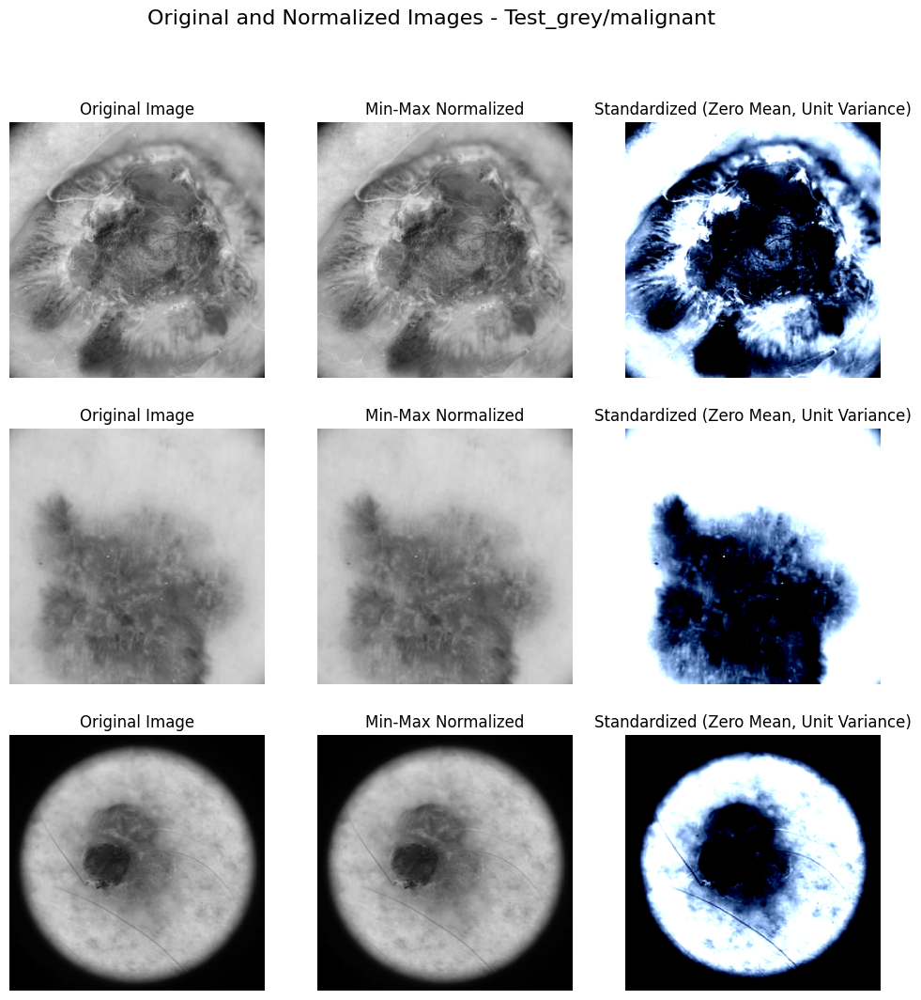

In [28]:
# Import necessary libraries
import os
import random
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms

# Define dataset directories with full paths
train_dir = r"archive (1)/melanoma_cancer_dataset/train_grey"  # replace with the actual full path to your train folder
test_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test_grey"    # replace with the actual full path to your test folder

# Normalization and display code
def display_normalized_samples_from_all_folders(sample_size=3):
    """Displays original, Min-Max, and Standardized normalized images for samples from all folders."""
    # Updated to include the full directory path
    categories = [os.path.join(train_dir, "benign"), 
                  os.path.join(train_dir, "malignant"),
                  os.path.join(test_dir, "benign"), 
                  os.path.join(test_dir, "malignant")]
    
    for path in categories:
        if not os.path.exists(path):
            print(f"Path {path} does not exist.")
            continue
        
        category_name = os.path.basename(os.path.dirname(path)) + "/" + os.path.basename(path)
        print(f"\nDisplaying samples from category: {category_name}")
        images = random.sample(os.listdir(path), min(sample_size, len(os.listdir(path))))  # Randomly pick sample images
        fig, axes = plt.subplots(len(images), 3, figsize=(12, 4 * len(images)))
        fig.suptitle(f"Original and Normalized Images - {category_name.capitalize()}", fontsize=16)
        
        for i, img_name in enumerate(images):
            img_path = os.path.join(path, img_name)
            original_img = Image.open(img_path).convert("RGB")
            
            # Display the original image
            axes[i, 0].imshow(original_img)
            axes[i, 0].set_title("Original Image")
            axes[i, 0].axis("off")
            
            # Min-Max Normalization (0-1 scaling)
            min_max_img = min_max_normalization(original_img)
            axes[i, 1].imshow(min_max_img.permute(1, 2, 0))  # Rearrange dimensions for plotting
            axes[i, 1].set_title("Min-Max Normalized")
            axes[i, 1].axis("off")
            
            # Standardization Normalization (Zero Mean, Unit Variance)
            standardized_img = standardization_normalization(original_img)
            axes[i, 2].imshow(standardized_img.permute(1, 2, 0).clamp(0, 1))  # Clamp values for display
            axes[i, 2].set_title("Standardized (Zero Mean, Unit Variance)")
            axes[i, 2].axis("off")
        
        plt.show()

# Display normalized images for all folders
display_normalized_samples_from_all_folders(sample_size=3)


# Data Augmentation

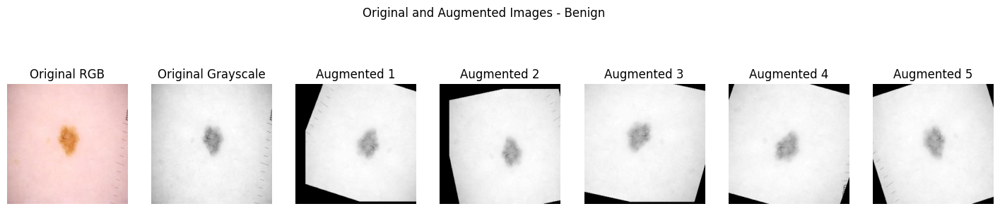

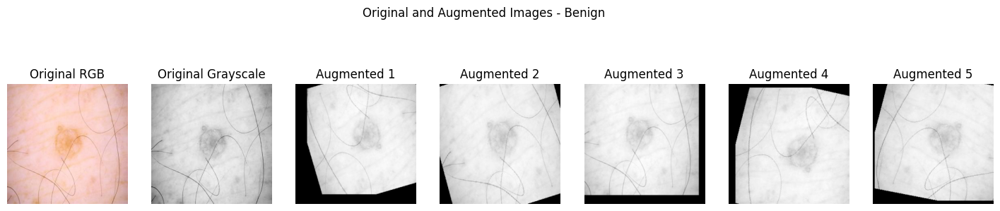

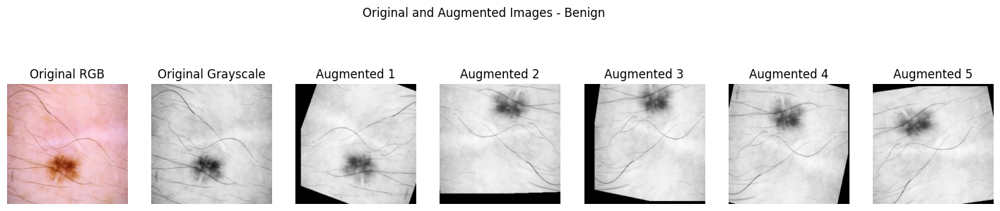

Completed augmentation and display for benign category in C:\IP\archive (1)\melanoma_cancer_dataset\train_grey.


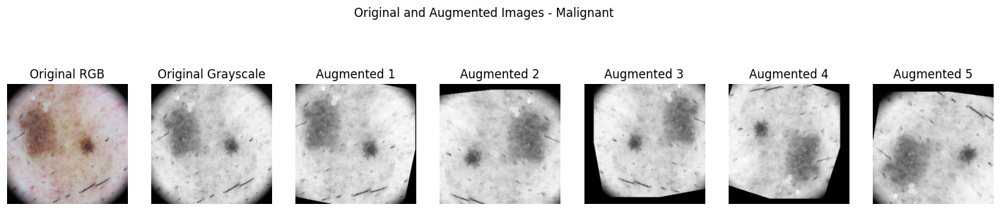

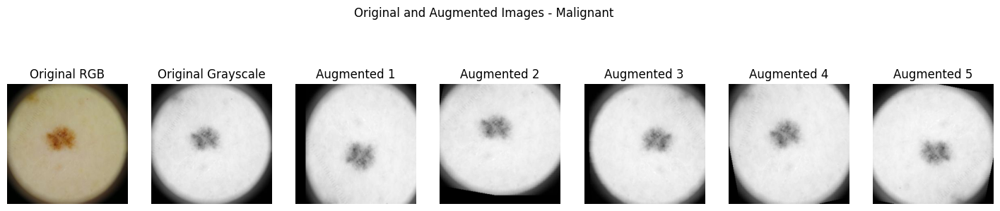

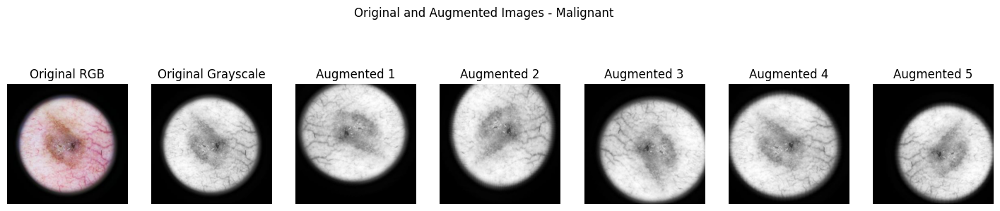

Completed augmentation and display for malignant category in C:\IP\archive (1)\melanoma_cancer_dataset\train_grey.


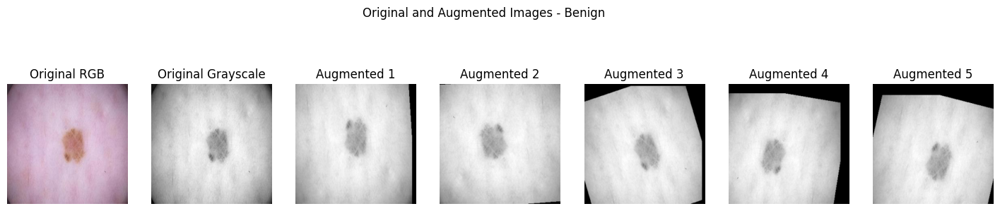

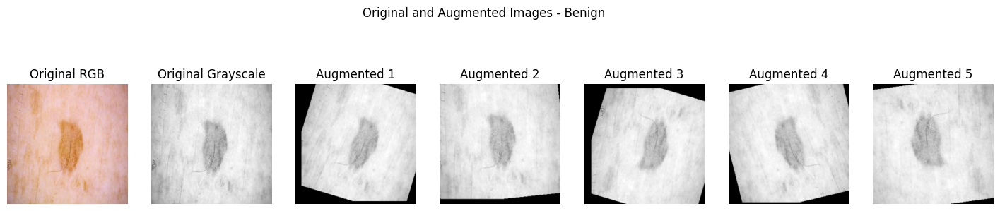

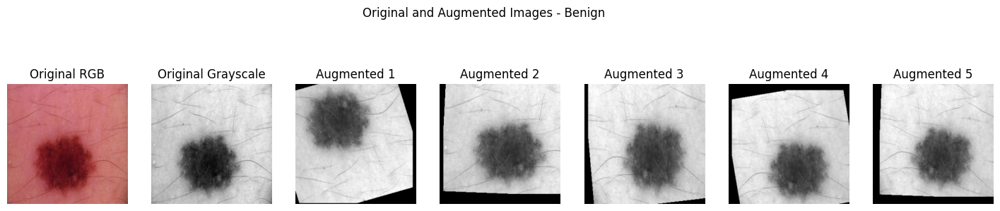

Completed augmentation and display for benign category in C:\IP\archive (1)\melanoma_cancer_dataset\test_grey.


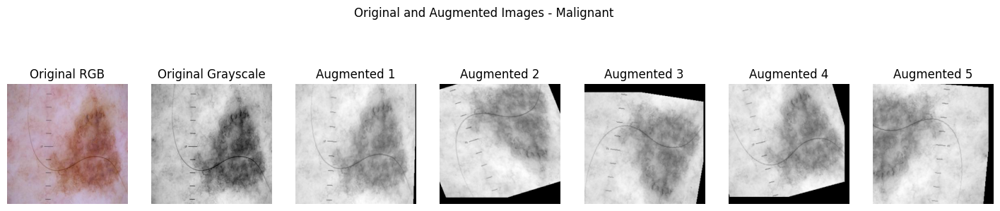

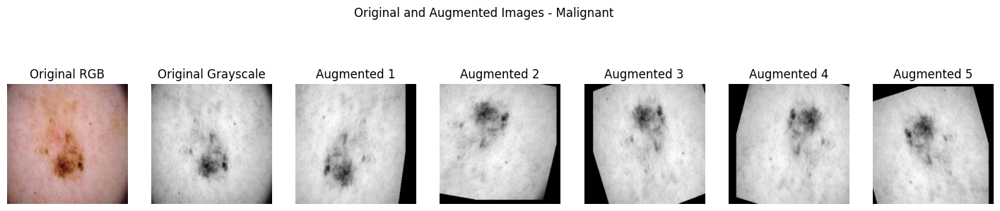

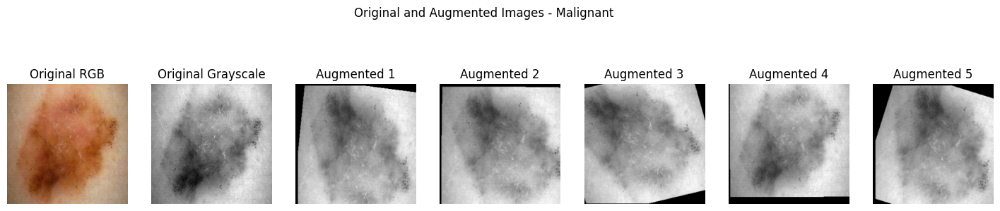

Completed augmentation and display for malignant category in C:\IP\archive (1)\melanoma_cancer_dataset\test_grey.
Data augmentation completed and images saved in respective folders.


In [29]:
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import random

# Define dataset directories with full paths
train_gray_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\train_grey"  # Folder containing grayscale train images
test_gray_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test_grey"    # Folder containing grayscale test images

# Define output directories for augmented images
train_augmented_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\train_augmented"
test_augmented_dir = r"C:\IP\archive (1)\melanoma_cancer_dataset\test_augmented"

# Define augmentation transforms
augmentation_transforms = transforms.Compose([
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.2))
])

# Function to augment and display images
def augment_and_display_images(input_dir, output_dir, display_samples=3):
    """Augments grayscale images, saves them, and displays the original with augmentations."""
    
    # Iterate over each category (benign and malignant)
    for category in ["benign", "malignant"]:
        input_category_path = os.path.join(input_dir, category)
        output_category_path = os.path.join(output_dir, category)
        os.makedirs(output_category_path, exist_ok=True)
        
        # Process each image in the category folder
        images_displayed = 0
        for img_name in os.listdir(input_category_path):
            img_path = os.path.join(input_category_path, img_name)
            
            # Load the original RGB and grayscale images
            original_rgb_path = img_path.replace("_grey", "")  # Assuming RGB images are in a similar directory structure
            if not os.path.exists(original_rgb_path):
                print(f"Original RGB image not found for {img_name}. Skipping.")
                continue
            
            with Image.open(original_rgb_path) as rgb_img, Image.open(img_path) as gray_img:
                
                # Save and display augmentations
                augmented_images = []
                for i in range(5):  # Create 5 augmented images
                    augmented_img = augmentation_transforms(gray_img)
                    aug_img_name = f"{os.path.splitext(img_name)[0]}_aug_{i}.png"
                    aug_img_path = os.path.join(output_category_path, aug_img_name)
                    augmented_img.save(aug_img_path)  # Save each augmented image
                    augmented_images.append(augmented_img)
                
                # Display the original RGB, grayscale, and augmented images in a row
                if images_displayed < display_samples:
                    fig, axes = plt.subplots(1, 7, figsize=(18, 4))
                    fig.suptitle(f"Original and Augmented Images - {category.capitalize()}")
                    
                    # Display original RGB image
                    axes[0].imshow(rgb_img)
                    axes[0].set_title("Original RGB")
                    axes[0].axis("off")
                    
                    # Display original grayscale image
                    axes[1].imshow(gray_img, cmap="gray")
                    axes[1].set_title("Original Grayscale")
                    axes[1].axis("off")
                    
                    # Display augmented images
                    for j, aug_img in enumerate(augmented_images):
                        axes[j + 2].imshow(aug_img, cmap="gray")
                        axes[j + 2].set_title(f"Augmented {j+1}")
                        axes[j + 2].axis("off")
                    
                    plt.show()
                    images_displayed += 1
        
        print(f"Completed augmentation and display for {category} category in {input_dir}.")

# Run augmentation and display for train and test directories
augment_and_display_images(train_gray_dir, train_augmented_dir, display_samples=3)
augment_and_display_images(test_gray_dir, test_augmented_dir, display_samples=3)

print("Data augmentation completed and images saved in respective folders.")
